# Temperature compensation
By: \
Julia Bijl (s1055050)\
Eddi Bruyn (s1018033)\
Lucia Rust (s1053676)

In [1]:
import pandas as pd
from io import StringIO
import numpy as np
import matplotlib.pyplot as plt
import os

## Functions for temperature compensation

In [2]:
def array_creation_mat(path_mat, start_file):
    """
    Here the pixel and temperature arrays are created for the files of the chosen material.
    
    path_mat (string): path to the folder of the files of the chosen material
    start_file (string): start of the filename of the files to be used
    
    returns: 
    pixels_mat (float list): The pixels values of the chosen material, per pixel
    temps_mat (float list): The temperatures of the measurements of the chosen material
    """
    
    
    # Creation of the panda datafiles for the chosen material, from all those csv files
    dfs_mat = []
    for file in os.listdir(path_mat):
        if file.startswith(start_file):
            df = pd.read_csv(path_mat+"/"+file)
            dfs_mat.append(df)
    
    # The temperature and pixel values, from all datafiles of the chosen material
    temps_mat = [float(df.iloc[15].to_numpy()[0].split(";")[1]) for df in dfs_mat]
    pixels_mat = []
    for i in range(128):
        pixels_mat.append([int(df.iloc[24].to_numpy()[0].split(";")[1+i]) for df in dfs_mat])
    return pixels_mat, temps_mat

In [3]:
def array_creation_base(path_baseline, start_file):
    """
    Here the pixel and temperature arrays are created for the baseline files.
    
    path_baseline (string): path to the folder of the baseline files
    start_file (string): start of the filename of the files to be used
    
    returns: 
    pixels (float list): list of the pixel values in the baseline, per pixel
    temps_rnd (float list): list of all temperatures in the baseline, rounded to 1.
    temps_set (set): set of all unique temperatures in the baseline
    """
    
    # Creation of the panda datafiles from all csv files in the ND_0_0_external folder (baseline)
    dfs = []
    for file in os.listdir(path_baseline):
        if file.startswith(start_file):
            df = pd.read_csv(path_baseline+"/"+file)
            dfs.append(df)
    
    # The pixel values for each pixel, from all datafiles of the baseline
    pixels = []
    for i in range(128):
        pixels.append([int(df.iloc[24].to_numpy()[0].split(";")[1+i]) for df in dfs])
        
    # The temperatures from all datafiles of the baseline
    temps = [float(df.iloc[15].to_numpy()[0].split(";")[1]) for df in dfs]
    temps_rnd = [round(temp,1) for temp in temps] # Rounded to 1 decimal
    temps_set = sorted(set(temps_rnd)) # Put in a set and sorted from low to high
    return pixels, temps_rnd, temps_set

In [4]:
def clean_pixels(temps_rnd,temps_set,pixels):
    """
    Here the pixel values of the baseline are cleaned per pixel, per temperature, 
    so the mean is taken per unique temperature
    
    temps_rnd (float list): list of all temperatures in the baseline, rounded to 1.
    temps_set (set): set of all unique temperatures in the baseline
    pixels (float list): list of the pixel values in the baseline, per pixel
    
    returns: array with the cleaned values, for all pixels, for all unique temperatures in the baseline
    """
    
    # All the indices of the temperatures in the original rounded temperature array 
    # for all temperatures in the set of temperatures (of the baseline)
    indices_ = []
    for temp in temps_set:
        indices = [i for i, x in enumerate(temps_rnd) if x == temp]
        indices_.append(indices)
        
    # For all pixels and all temperatures in the set (both of the baseline), it gets the mean of pixel value
    # of all occasions the certain temperature was in the original rounded temperature array of the baseline 
    # dataset. The mean values are gathered for all temperatures, for all pixels. To normalise these values a bit,
    # the minimum value of these mean values is substracted from all mean values, per pixel. 
    pixels_cleaned = []
    for i in range(128):
        pixel_ = []
        for j in range(len(temps_set)):
            clean = np.mean([pixels[i][indices_[j][k]] for k in range(len(indices_[j]))])
            pixel_.append(clean)
        pixels_cleaned.append([val-min(pixel_) for val in pixel_])
    return pixels_cleaned

In [5]:
def compensate_temperature(pixels_cleaned,temps_set,pixels_mat,temps_mat):
    """
    Here the values are actually compensated for the temperature
    
    pixels_cleaned (float list): cleaned values, for all pixels, for all unique temperatures in the baseline
    temps_set (set): set of all unique temperatures in the baseline
    pixels_mat (float list): The pixels values of the chosen material, per pixel
    temps_mat (float list): The temperatures of the measurements of the chosen material
    
    returns: array with the temperature compensated values for all pixels, for all temperatures
    """
    
    # For all temperatures that occured in the datafiles for the chosen material, the temperature is rounded to
    # 1 decimal. Then, it is checked whether the temperature is in the temps_set, if so its index is given to the
    # index_temp array. If not, the index of the closest value (smallest difference to it) is given to the 
    # index_temp array.
    index_temp = np.zeros(len(temps_mat),dtype=int)
    for i in range(len(temps_mat)):
        temp = round(temps_mat[i],1)
        if temp in temps_set:
            index_temp[i] = int(temps_set.index(temp))
        else:
            diffs = [abs(temp_set - temp) for temp_set in temps_set]
            index_temp[i] = int(np.argmin(diffs))
          
    # The final temperature compensation for each pixel, for each temperature for the chosen material.
    # It uses the index_temp array to get the relevant cleaned value in pixels_cleaned for the current temperature,
    # which it substracts from the value of the current pixel, for each temperature. Now it is compensated for the temperature.
    pixels_mat_comp = [[pixels_mat[i][j] - pixels_cleaned[i][temp_i] for j,temp_i in enumerate(index_temp)] for i in range(128)]
    return pixels_mat_comp

In [6]:
def temperature_compensation(path_mat, path_baseline, start_mat, start_base):
    """
    The temperature compensation algorithm
    
    path_mat (string): path to the folder of files of the chosen material
    path_baseline (string): path to the folder of the baseline files
    start_mat (string): start of the filename of the files to be used for the chosen material
    start_base (string): start of the filename of the files to be used for the baseline
    
    returns: 
    pixels_mat_comp (float list): array with the temperature compensated values for all pixels, for all temperatures 
    temps_mat (float list): array with all temperatures of the measurements of the chosen material
    """
    
    pixels_mat, temps_mat = array_creation_mat(path_mat,start_mat)
    pixels, temps_rnd, temps_set = array_creation_base(path_baseline,start_base)
    pixels_cleaned = clean_pixels(temps_rnd,temps_set,pixels)
    pixels_mat_comp = compensate_temperature(pixels_cleaned,temps_set,pixels_mat,temps_mat)
    
    return pixels_mat_comp, temps_mat

In [7]:
def temperature_compensation_file(path_mat_file, path_baseline):
    """
    Does temperature compensation for a single file of the chose material
    
    path_mat_file (string): path to the file in the folder of the chosen material
    path_baseline (string): path to the folder of the baseline files
    
    returns:
    pixels_mat_comp (float list): array with the temperature compensated values for all pixels, for all temperatures 
    temps_mat (float): temperature during the measurements of the chosen file
    """
    
    # The panda datafile of the chosen file
    df_mat = pd.read_csv(path_mat_file)
    
    # The temperature and pixel values, from the chosen file of the chosen material
    temp_mat = float(df_mat.iloc[15].to_numpy()[0].split(";")[1])
    pixels_mat = []
    for i in range(128):
        pixels_mat.append(int(df_mat.iloc[24].to_numpy()[0].split(";")[1+i]))

    pixels, temps_rnd, temps_set = array_creation_base(path_baseline)
    pixels_cleaned = clean_pixels(temps_rnd,temps_set,pixels)
    
    # The temperature is rounded to 1 decimal. Then, it is checked whether the temperature is in the temps_set, 
    # if so its index is saved. If not, the index of the closest value (smallest difference to it) is saved.
    temp = round(temp_mat,1)
    if temp in temps_set:
        index_temp = int(temps_set.index(temp))
    else:
        diffs = [abs(temp_set - temp) for temp_set in temps_set]
        index_temp = int(np.argmin(diffs))
        
    # The final temperature compensation for each pixel, for the temperature of the chosen file.
    # It uses the index_temp to get the relevant cleaned value in pixels_cleaned for the current temperature,
    # which it substracts from the value of the current pixel. Now it is compensated for the temperature.    
    pixels_mat_comp = [pixels_mat[i] - pixels_cleaned[i][index_temp] for i in range(128)]
    
    return pixels_mat_comp, temp_mat

In [8]:
def Plot_temperature_compensation_of_pixels(path_mat, path_baseline, start_mat, start_base, temperature):
    """
    Plots the compensated pixel values for a certain temperature and the original pixel values
    
    path_mat (string): path to the folder of files of the chosen material
    path_baseline (string): path to the folder of the baseline files
    start_mat (string): start of the filename of the files to be used for the chosen material
    start_base (string): start of the filename of the files to be used for the baseline
    temperature (float/integer): the desired temperature
    
    returns: array of compensated pixel values and array of original pixel values
    """
    
    pixels_mat, temps_mat = array_creation_mat(path_mat,start_mat)
    pixels, temps_rnd, temps_set = array_creation_base(path_baseline,start_base)
    pixels_cleaned = clean_pixels(temps_rnd,temps_set,pixels)
    pixels_mat_comp = compensate_temperature(pixels_cleaned,temps_set,pixels_mat,temps_mat)
    
    # Here, it is checked whether the temperature is in the temps_set. 
    # If so its index is saved. If not, the index of the closest value (smallest difference to it) is saved.
    if temperature in temps_mat:
        index_temp = temps_mat.index(temperature)
    else:
        diffs = [abs(temp - temperature) for temp in temps_mat]
        index_temp = np.argmin(diffs)
    
    compensated = [i[index_temp] for i in pixels_mat_comp] # The array with compensated pixel values for the desired temperature
    original = [i[index_temp] for i in pixels_mat] # The array with the original pixel values for the desired temperature
    
    plt.plot(range(128), [i[index_temp] for i in pixels_mat], label="original")
    plt.plot(range(128), [i[index_temp] for i in pixels_mat_comp], label="compensated")
    plt.xlabel("Pixels")
    plt.legend()
    plt.title(f"Compensated pixels of temperature {temperature}")
    plt.show()
    
    return compensated, original

In [168]:
pixels_mat_comp, temps_mat = temperature_compensation(path_mat="Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_diesel_20200716_123723.960", path_baseline="Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_ND_0_0_external_20200617_143618.773", start_mat="AFS___PHASE1_QCell_005", start_base="AFS___PHASE1_QCell_005")

## Plots

### QCell 5

In [109]:
pixels_mat, temps_mat = array_creation_mat(path_mat="Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_diesel_20200716_123723.960", start_file="AFS___PHASE1_QCell_005")
pixels, temps_rnd, temps_set = array_creation_base(path_baseline="Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_ND_0_0_external_20200617_143618.773", start_file="AFS___PHASE1_QCell_005")
pixels_cleaned = clean_pixels(temps_rnd,temps_set,pixels)
pixels_mat_comp = compensate_temperature(pixels_cleaned,temps_set,pixels_mat,temps_mat)

#### Temperature compensation of a single file

In [114]:
# The panda datafile of the chosen file
df_mat = pd.read_csv("Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_diesel_20200716_123723.960/AFS___PHASE1_QCell_005_10488013_S100755_diesel_20200716_123857.516.csv")

# The temperature and pixel values, from the chosen file of the chosen material
temp_mat = float(df_mat.iloc[15].to_numpy()[0].split(";")[1])
pixels_mat_ = []
for i in range(128):
    pixels_mat_.append(int(df_mat.iloc[24].to_numpy()[0].split(";")[1+i]))

# The temperature is rounded to 1 decimal. Then, it is checked whether the temperature is in the temps_set, 
# if so its index is saved. If not, the index of the closest value (smallest difference to it) is saved.
temp = round(temp_mat,1)
if temp in temps_set:
    index_temp = int(temps_set.index(temp))
else:
    diffs = [abs(temp_set - temp) for temp_set in temps_set]
    index_temp = int(np.argmin(diffs))

# The final temperature compensation for each pixel, for the temperature of the chosen file.
# It uses the index_temp to get the relevant cleaned value in pixels_cleaned for the current temperature,
# which it substracts from the value of the current pixel. Now it is compensated for the temperature.    
pixels_mat_comp_ = [pixels_mat_[i] - pixels_cleaned[i][index_temp] for i in range(128)]

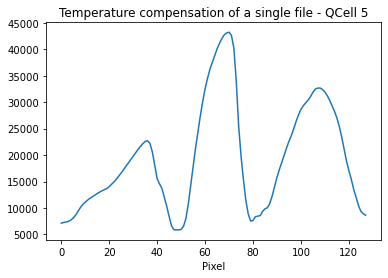

In [115]:
plt.plot(range(128),pixels_mat_comp_)
plt.title("Temperature compensation of a single file - QCell 5")
plt.xlabel("Pixel")
plt.show()

#### Compensation of a desired temperature

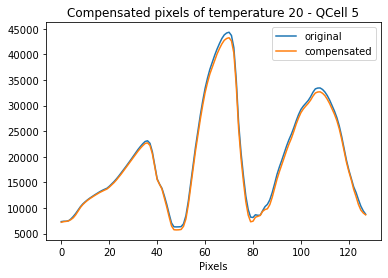

In [116]:
temperature = 20
# Here, it is checked whether the temperature is in the temps_set. 
# If so its index is saved. If not, the index of the closest value (smallest difference to it) is saved.
if temperature in temps_mat:
    index_temp = temps_mat.index(temperature)
else:
    diffs = [abs(temp - temperature) for temp in temps_mat]
    index_temp = np.argmin(diffs)

compensated = [i[index_temp] for i in pixels_mat_comp] # The array with compensated pixel values for the desired temperature
original = [i[index_temp] for i in pixels_mat] # The array with the original pixel values for the desired temperature

plt.plot(range(128), [i[index_temp] for i in pixels_mat], label="original")
plt.plot(range(128), [i[index_temp] for i in pixels_mat_comp], label="compensated")
plt.xlabel("Pixels")
plt.legend()
plt.title(f"Compensated pixels of temperature {temperature} - QCell 5")
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


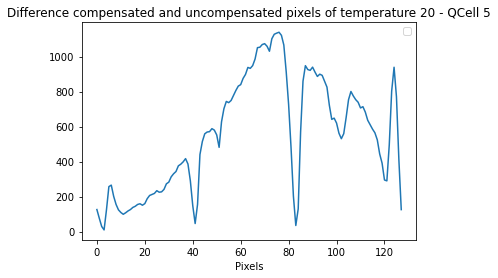

In [117]:
# Here, it is checked whether the temperature is in the temps_set. 
# If so its index is saved. If not, the index of the closest value (smallest difference to it) is saved.
temperature = 20
if temperature in temps_mat:
    index_temp = temps_mat.index(temperature)
else:
    diffs = [abs(temp - temperature) for temp in temps_mat]
    index_temp = np.argmin(diffs)

compensated = [i[index_temp] for i in pixels_mat_comp] # The array with compensated pixel values for the desired temperature
original = [i[index_temp] for i in pixels_mat] # The array with the original pixel values for the desired temperature
diff = [original[i]-compensated[i] for i in range(len(compensated))]

plt.plot(diff)
plt.xlabel("Pixels")
plt.legend()
plt.title(f"Difference compensated and uncompensated pixels of temperature {temperature} - QCell 5")
plt.show()

#### Plots of the (un) compensated pixel values of the chosen material and baseline

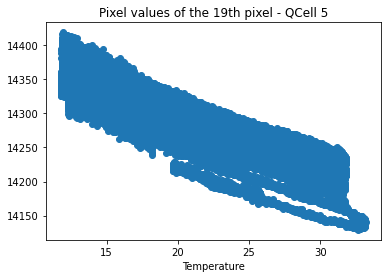

In [86]:
plt.scatter(temps_mat, pixels_mat[20][:])
plt.title("Pixel values of the 19th pixel - QCell 5")
plt.xlabel("Temperature")
plt.show()

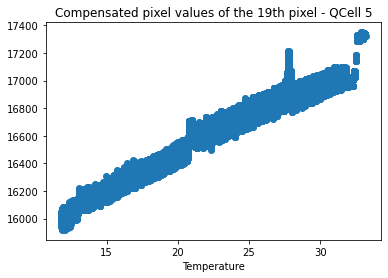

In [85]:
plt.scatter(temps_mat, pixels_mat_comp[90][:])
plt.title("Compensated pixel values of the 19th pixel - QCell 5")
plt.xlabel("Temperature")
plt.show()

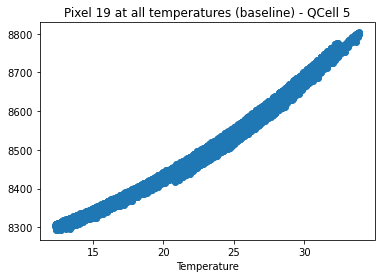

In [123]:
plt.scatter(temps_rnd, pixels[0][:])
plt.xlabel("Temperature")
plt.title("Pixel 19 at all temperatures (baseline) - QCell 5")
plt.show()

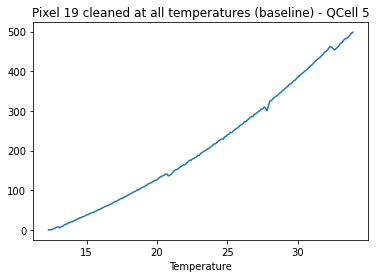

In [124]:
plt.plot(temps_set,pixels_cleaned[0][:])
plt.xlabel("Temperature")
plt.title("Pixel 19 cleaned at all temperatures (baseline) - QCell 5")
plt.show()

#### Temperature profile

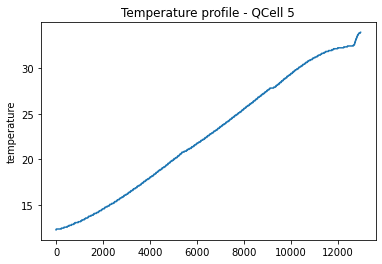

In [112]:
plt.plot(range(len(temps_rnd)),sorted(temps_rnd))
plt.ylabel("temperature")
plt.title("Temperature profile - QCell 5")
plt.show()

#### Subplots of temperature compensation for each pixel

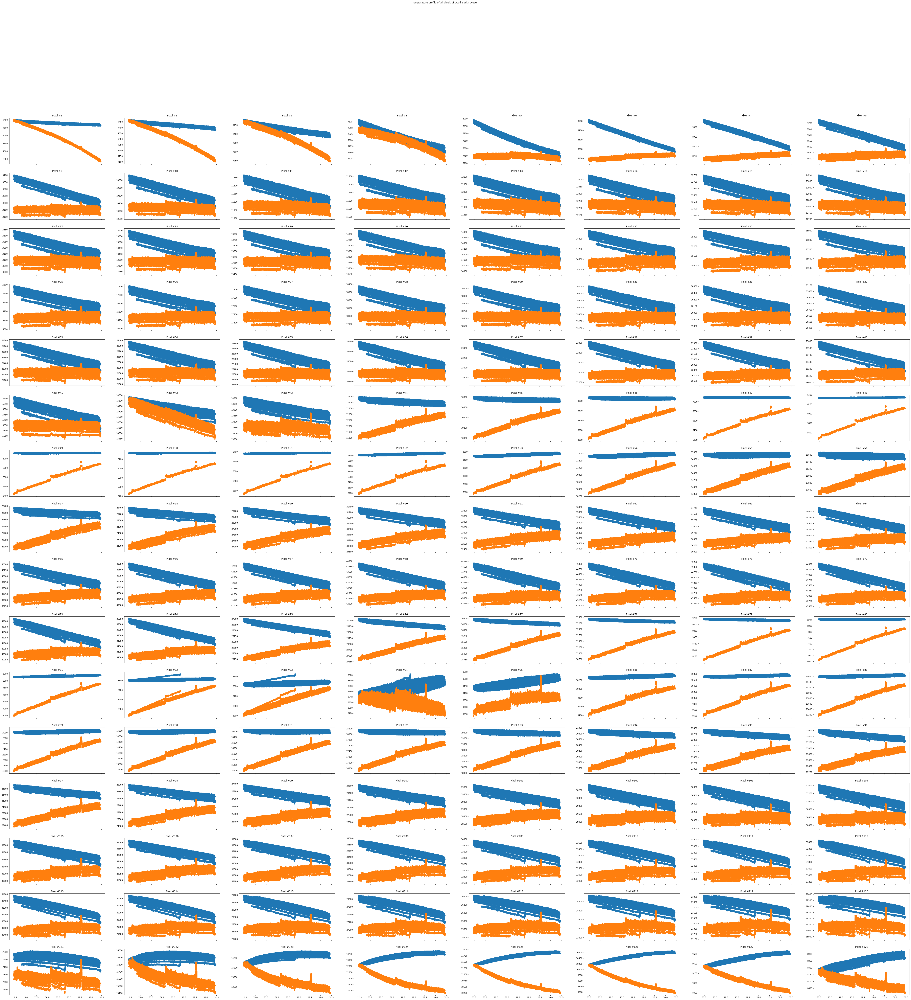

In [113]:
fig, axs = plt.subplots(nrows=16,ncols=8, sharex=True, figsize=(80, 80))
count = 0
for i in range(16):
    for j in range(8):
        axs[i,j].set_title(f"Pixel #{count+1}")
        axs[i,j].scatter(temps_mat,pixels_mat[count][:])
        axs[i,j].scatter(temps_mat,pixels_mat_comp[count][:])
        # x-axis is temperature, y-axis is pixel value
        # blue is Uncompensated, orange is Compensated
        count += 1
plt.suptitle("Temperature profile of all pixels of Qcell 5 with Diesel")
plt.show()

#### Subplots of Jet

In [131]:
pixels_jet, temps_jet = array_creation_mat(path_mat="Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_Jet_external_20200717_085413.686", start_file="AFS___PHASE1_QCell_005")
pixels, temps_rnd, temps_set = array_creation_base(path_baseline="Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_ND_0_0_external_20200617_143618.773", start_file="AFS___PHASE1_QCell_005")
pixels_cleaned = clean_pixels(temps_rnd,temps_set,pixels)
pixels_jet_comp = compensate_temperature(pixels_cleaned,temps_set,pixels_jet,temps_jet)

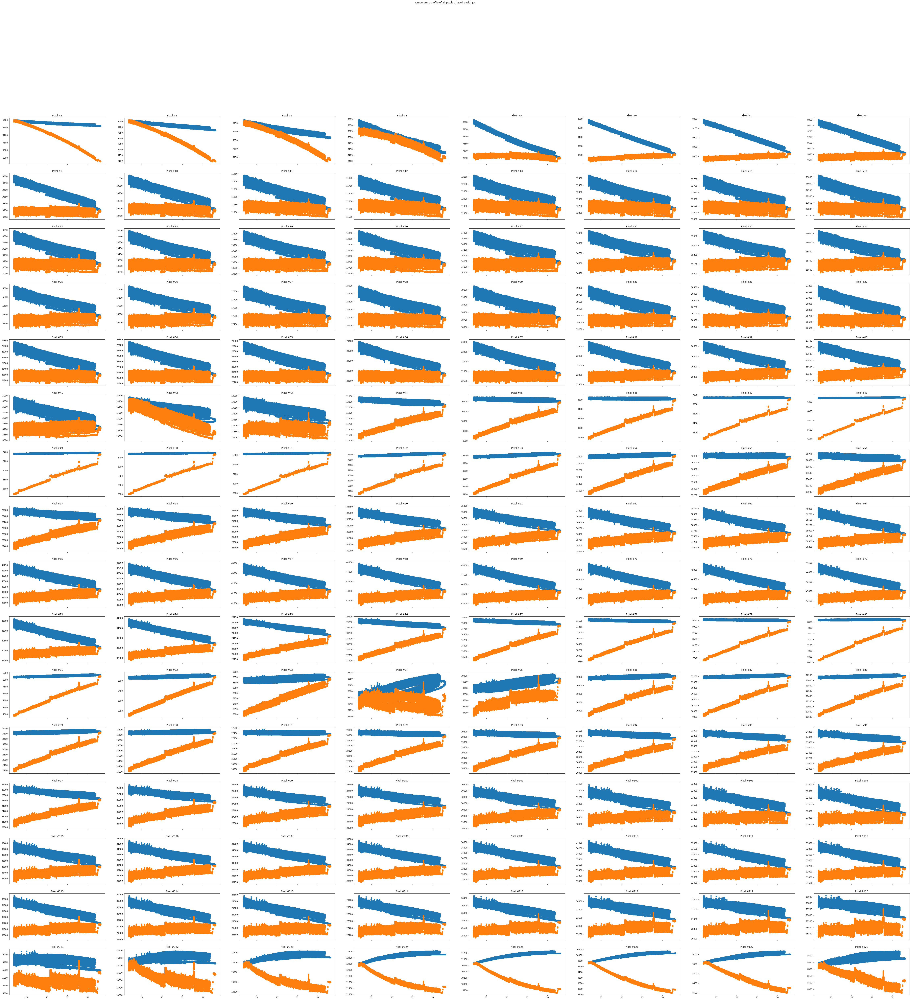

In [132]:
fig, axs = plt.subplots(nrows=16,ncols=8, sharex=True, figsize=(80, 80))
count = 0
for i in range(16):
    for j in range(8):
        axs[i,j].set_title(f"Pixel #{count+1}")
        axs[i,j].scatter(temps_jet,pixels_jet[count][:])
        axs[i,j].scatter(temps_jet,pixels_jet_comp[count][:])
        # x-axis is temperature, y-axis is pixel value
        # blue is Uncompensated, orange is Compensated
        count += 1
plt.suptitle("Temperature profile of all pixels of Qcell 5 with Jet")
plt.show()

#### Subplots of EBOB

In [9]:
pixels_ebob, temps_ebob = array_creation_mat(path_mat="Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_EBOB_external_20200722_142559.701", start_file="AFS___PHASE1_QCell_005")
pixels, temps_rnd, temps_set = array_creation_base(path_baseline="Temp sweeps QCells/QCell5/AFS___QCell_005_10488013_S100755_ND_0_0_external_20200617_143618.773", start_file="AFS___PHASE1_QCell_005")
pixels_cleaned = clean_pixels(temps_rnd,temps_set,pixels)
pixels_ebob_comp = compensate_temperature(pixels_cleaned,temps_set,pixels_ebob,temps_ebob)

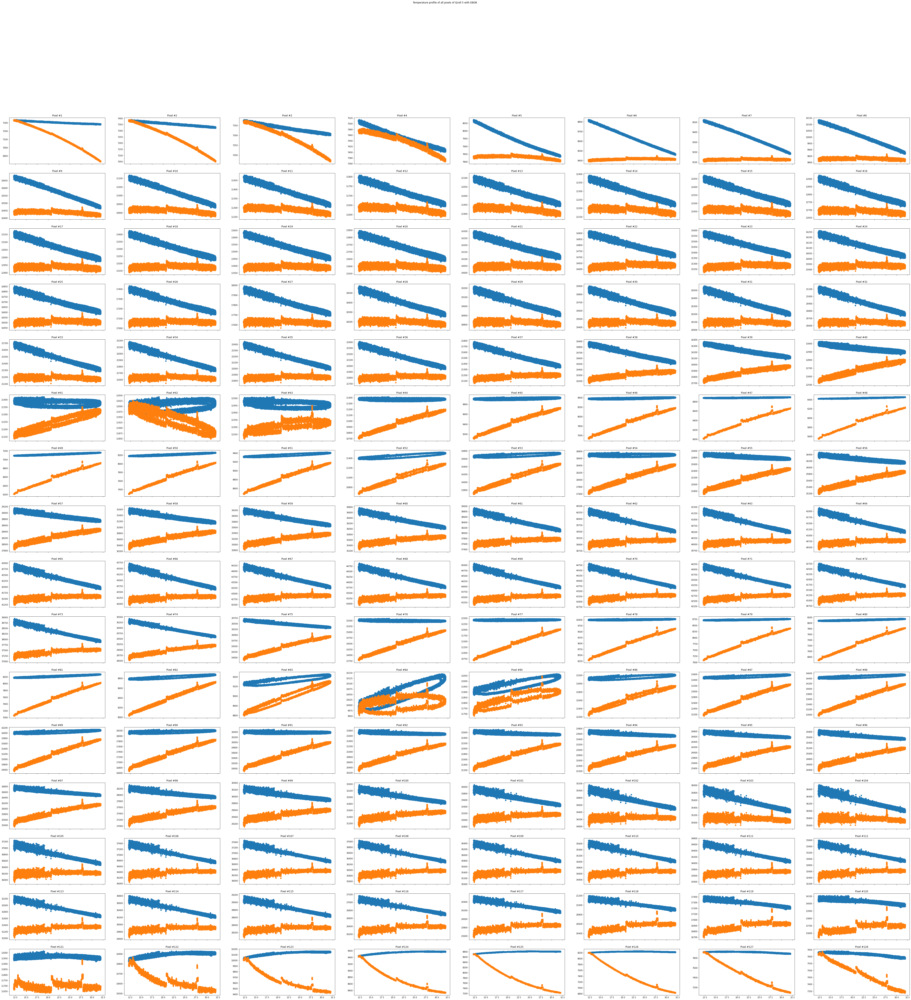

In [10]:
fig, axs = plt.subplots(nrows=16,ncols=8, sharex=True, figsize=(80, 80))
count = 0
for i in range(16):
    for j in range(8):
        axs[i,j].set_title(f"Pixel #{count+1}")
        axs[i,j].scatter(temps_ebob,pixels_ebob[count][:])
        axs[i,j].scatter(temps_ebob,pixels_ebob_comp[count][:])
        # x-axis is temperature, y-axis is pixel value
        # blue is Uncompensated, orange is Compensated
        count += 1
plt.suptitle("Temperature profile of all pixels of Qcell 5 with EBOB")
plt.show()

### QCell 7

In [28]:
pixels_dies, temps_dies = array_creation_mat(path_mat="Temp sweeps QCells/QCell7/AFS___QCell_007_10488009_S100776_diesel_external_20200716_123918.772", start_file="AFS___PHASE1_QCell_007")
pixels7, temps_rnd7, temps_set7 = array_creation_base(path_baseline="Temp sweeps QCells/QCell7/AFS_none_none_Qcell7_104880099_S100776_ND_0_0_external_20240215_165633.777", start_file="AFS_none_none_PHASE1_Qcell7")
pixels_cleaned7 = clean_pixels(temps_rnd7,temps_set7,pixels7)
pixels_dies_comp = compensate_temperature(pixels_cleaned7,temps_set7,pixels_dies,temps_dies)

#### Compensation of a desired temperature

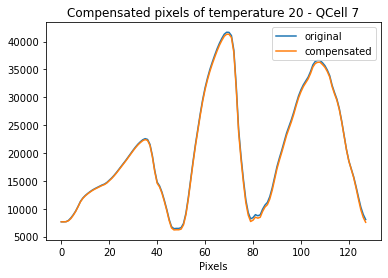

In [129]:
temperature = 20
# Here, it is checked whether the temperature is in the temps_set. 
# If so its index is saved. If not, the index of the closest value (smallest difference to it) is saved.
if temperature in temps_dies:
    index_temp = temps_dies.index(temperature)
else:
    diffs = [abs(temp - temperature) for temp in temps_dies]
    index_temp = np.argmin(diffs)

compensated = [i[index_temp] for i in pixels_dies_comp] # The array with compensated pixel values for the desired temperature
original = [i[index_temp] for i in pixels_dies] # The array with the original pixel values for the desired temperature

plt.plot(range(128), [i[index_temp] for i in pixels_dies], label="original")
plt.plot(range(128), [i[index_temp] for i in pixels_dies_comp], label="compensated")
plt.xlabel("Pixels")
plt.legend()
plt.title(f"Compensated pixels of temperature {temperature} - QCell 7")
plt.show()

#### Plots of the (un) compensated pixel values of the chosen material and baseline

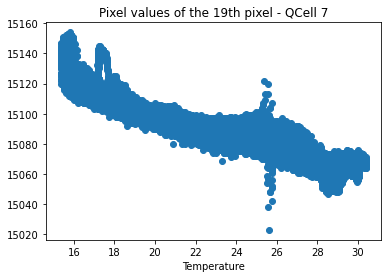

In [94]:
plt.scatter(temps_dies, pixels_dies[20][:])
plt.title("Pixel values of the 19th pixel - QCell 7")
plt.xlabel("Temperature")
plt.show()

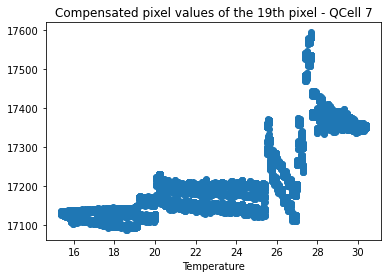

In [93]:
plt.scatter(temps_dies, pixels_dies_comp[90][:])
plt.title("Compensated pixel values of the 19th pixel - QCell 7")
plt.xlabel("Temperature")
plt.show()

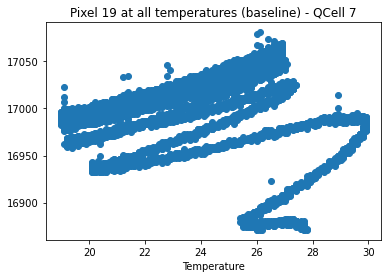

In [121]:
plt.scatter(temps_rnd7, pixels7[20][:])
plt.xlabel("Temperature")
plt.title("Pixel 19 at all temperatures (baseline) - QCell 7")
plt.show()

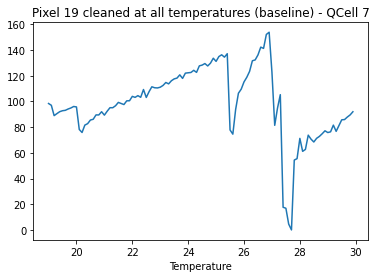

In [122]:
plt.plot(temps_set7,pixels_cleaned7[20][:])
plt.xlabel("Temperature")
plt.title("Pixel 19 cleaned at all temperatures (baseline) - QCell 7")
plt.show()

#### Temperature profile

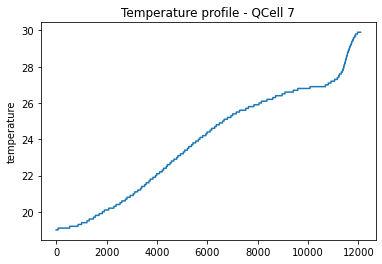

In [108]:
plt.plot(range(len(temps_rnd7)),sorted(temps_rnd7))
plt.ylabel("temperature")
plt.title("Temperature profile - QCell 7")
plt.show()

#### Subplots of temperature compensation for each pixel

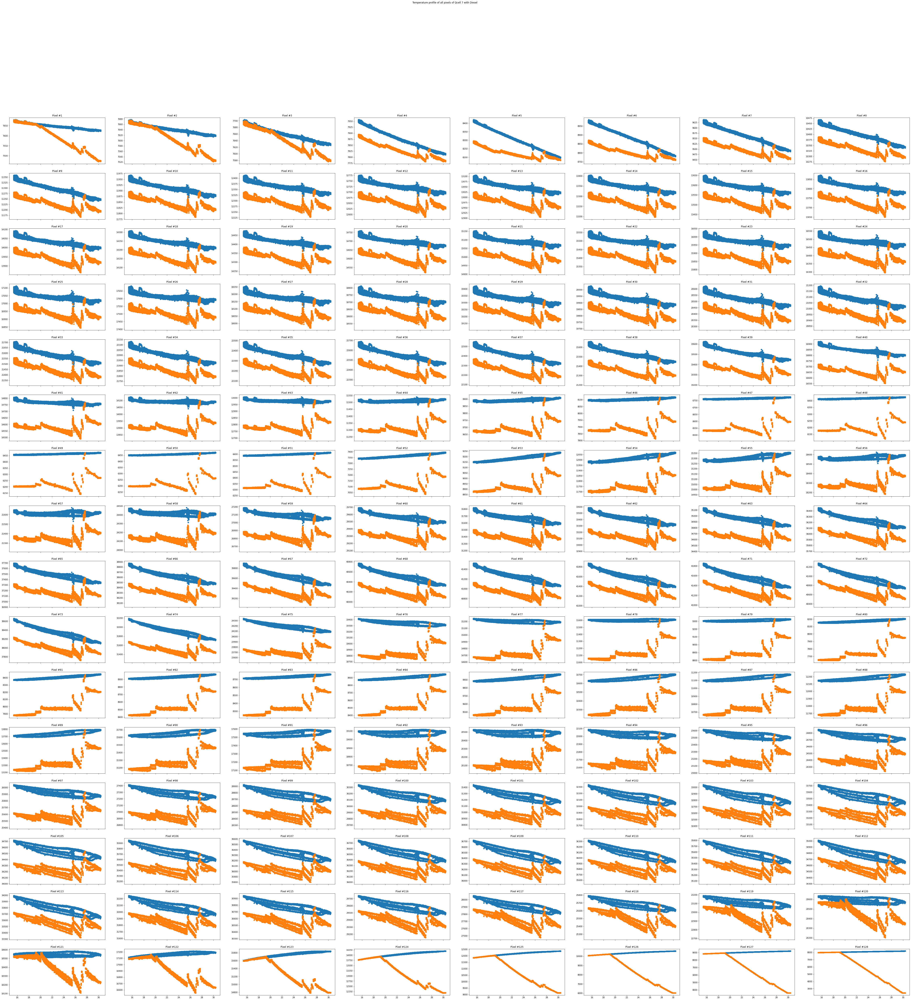

In [82]:
fig, axs = plt.subplots(nrows=16,ncols=8, sharex=True, figsize=(80, 80))
count = 0
for i in range(16):
    for j in range(8):
        axs[i,j].set_title(f"Pixel #{count+1}")
        axs[i,j].scatter(temps_dies,pixels_dies[count][:],label="Not compensated")
        axs[i,j].scatter(temps_dies,pixels_dies_comp[count][:],label="Compensated")
        # x-axis is temperature, y-axis is pixel value
        # blue is Uncompensated, orange is Compensated
        count += 1
plt.suptitle("Temperature profile of all pixels of Qcell 7 with Diesel")
plt.show()

### QCell 8

In [42]:
pixels_dies8, temps_dies8 = array_creation_mat(path_mat="Temp sweeps QCells/QCell8/AFS___QCell_008_10488007_S100777_diesel_external_20200716_124009.848", start_file="AFS___PHASE1_QCell_008")
pixels8, temps_rnd8, temps_set8 = array_creation_base(path_baseline="Temp sweeps QCells/QCell8/AFS___QCell_008_10488007_S100777_ND_0_0_external_20200617_144103.575", start_file="AFS___PHASE1_QCell_008")
pixels_cleaned8 = clean_pixels(temps_rnd8,temps_set8,pixels8)
pixels_dies_comp8 = compensate_temperature(pixels_cleaned8,temps_set8,pixels_dies8,temps_dies8)

#### Compensation of a desired temperature

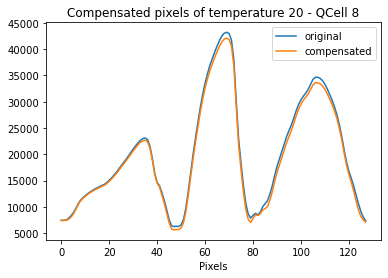

In [130]:
temperature = 20
# Here, it is checked whether the temperature is in the temps_set. 
# If so its index is saved. If not, the index of the closest value (smallest difference to it) is saved.
if temperature in temps_dies8:
    index_temp = temps_dies8.index(temperature)
else:
    diffs = [abs(temp - temperature) for temp in temps_dies8]
    index_temp = np.argmin(diffs)

compensated = [i[index_temp] for i in pixels_dies_comp8] # The array with compensated pixel values for the desired temperature
original = [i[index_temp] for i in pixels_dies8] # The array with the original pixel values for the desired temperature

plt.plot(range(128), [i[index_temp] for i in pixels_dies8], label="original")
plt.plot(range(128), [i[index_temp] for i in pixels_dies_comp8], label="compensated")
plt.xlabel("Pixels")
plt.legend()
plt.title(f"Compensated pixels of temperature {temperature} - QCell 8")
plt.show()

#### Difference compensated and uncompensated for a desired temperature

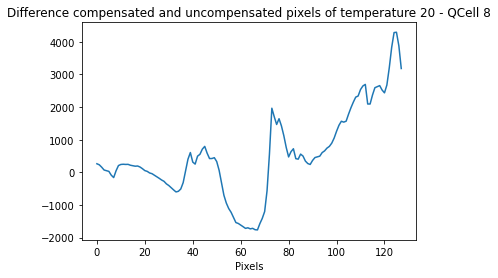

In [111]:
temperature = 20
if temperature in temps_dies8:
    index_temp = temps_dies8.index(temperature)
else:
    diffs = [abs(temp - temperature) for temp in temps_dies8]
    index_temp = np.argmin(diffs)

compensated = [i[index_temp] for i in pixels_dies_comp8_] # The array with compensated pixel values for the desired temperature
original = [i[index_temp] for i in pixels_dies] # The array with the original pixel values for the desired temperature
diff = [original[i]-compensated[i] for i in range(len(compensated))]

plt.plot(diff)
plt.xlabel("Pixels")
plt.title(f"Difference compensated and uncompensated pixels of temperature {temperature} - QCell 8")
plt.show()

#### Plots of the (un) compensated pixel values of the chosen material and baseline

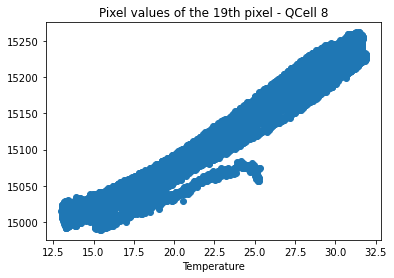

In [98]:
plt.scatter(temps_dies8, pixels_dies8[20][:])
plt.title("Pixel values of the 19th pixel - QCell 8")
plt.xlabel("Temperature")
plt.show()

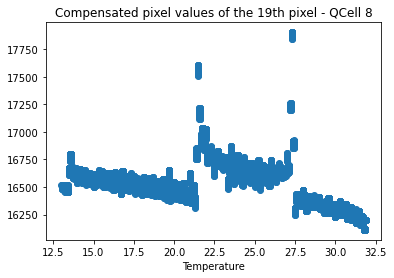

In [97]:
plt.scatter(temps_dies8, pixels_dies_comp8[90][:])
plt.title("Compensated pixel values of the 19th pixel - QCell 8")
plt.xlabel("Temperature")
plt.show()

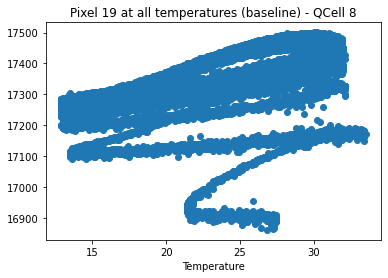

In [126]:
plt.scatter(temps_rnd8, pixels8[20][:])
plt.xlabel("Temperature")
plt.title("Pixel 19 at all temperatures (baseline) - QCell 8")
plt.show()

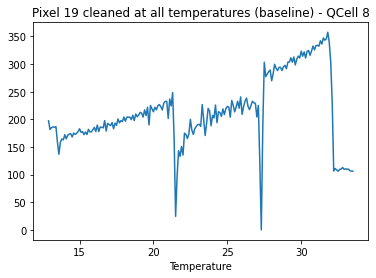

In [125]:
plt.plot(temps_set8,pixels_cleaned8[20][:])
plt.xlabel("Temperature")
plt.title("Pixel 19 cleaned at all temperatures (baseline) - QCell 8")
plt.show()

#### Temperature profile

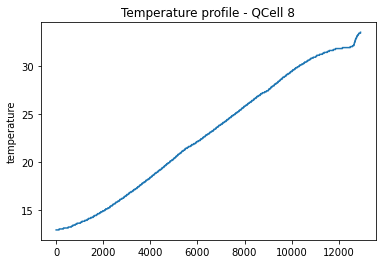

In [107]:
plt.plot(range(len(temps_rnd8)),sorted(temps_rnd8))
plt.ylabel("temperature")
plt.title("Temperature profile - QCell 8")
plt.show()

#### Subplots of temperature compensation for each pixel

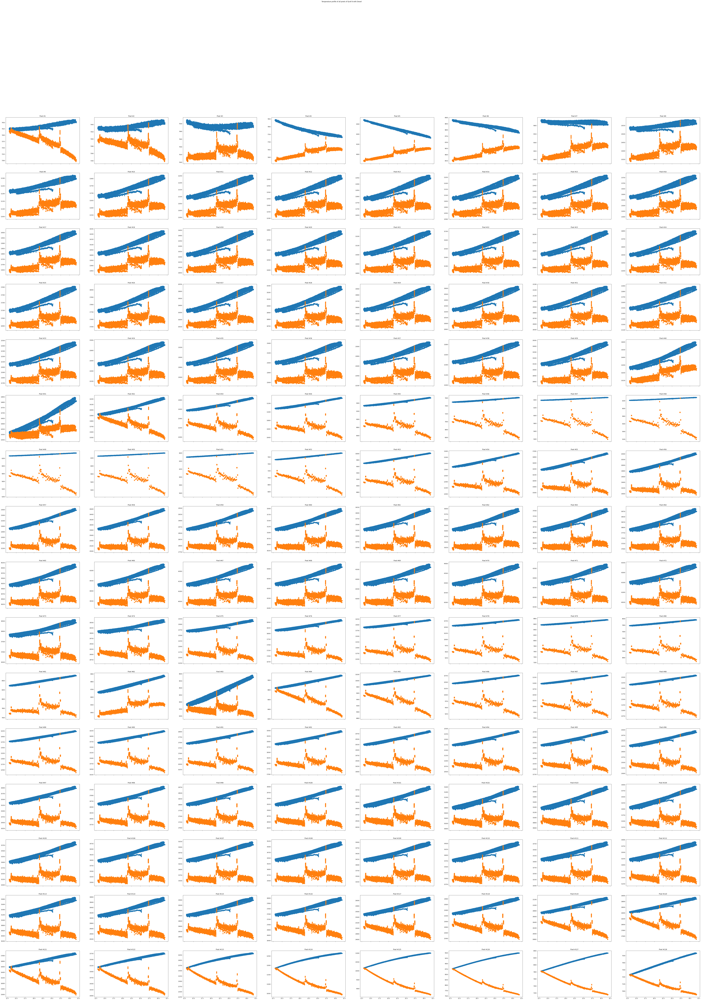

In [84]:
fig, axs = plt.subplots(nrows=16,ncols=8, sharex=True, figsize=(100, 130))
count = 0
for i in range(16):
    for j in range(8):
        axs[i,j].set_title(f"Pixel #{count+1}")
        axs[i,j].scatter(temps_dies8,pixels_dies8[count][:],label="Not compensated")
        axs[i,j].scatter(temps_dies8,pixels_dies_comp8[count][:],label="Compensated")
        # x-axis is temperature, y-axis is pixel value
        # blue is Uncompensated, orange is Compensated
        count += 1
plt.suptitle("Temperature profile of all pixels of Qcell 8 with Diesel")
plt.show()

### QCell 8 (internal as baseline)

In [7]:
pixels_dies8, temps_dies8 = array_creation_mat(path_mat="Temp sweeps QCells/QCell8/AFS___QCell_008_10488007_S100777_diesel_external_20200716_124009.848", start_file="AFS___PHASE1_QCell_008")
pixels8_, temps_rnd8_, temps_set8_ = array_creation_base(path_baseline="Temp sweeps QCells/QCell8/AFS___QCell_008_10488007_S100777_ND_0_0_internal_20200708_150424.383", start_file="AFS___PHASE1_QCell_008")
pixels_cleaned8_ = clean_pixels(temps_rnd8_,temps_set8_,pixels8_)
pixels_dies_comp8_ = compensate_temperature(pixels_cleaned8_,temps_set8_,pixels_dies8,temps_dies8)

#### Plots of the (un) compensated pixel values of the chosen material and baseline

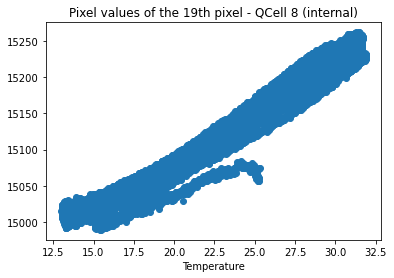

In [110]:
plt.scatter(temps_dies8, pixels_dies8[20][:])
plt.title("Pixel values of the 19th pixel - QCell 8 (internal)")
plt.xlabel("Temperature")
plt.show()

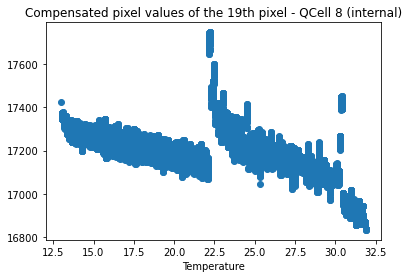

In [101]:
plt.scatter(temps_dies8, pixels_dies_comp8_[90][:])
plt.title("Compensated pixel values of the 19th pixel - QCell 8 (internal)")
plt.xlabel("Temperature")
plt.show()

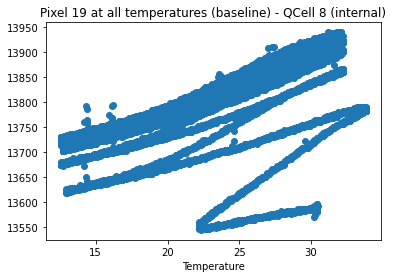

In [127]:
plt.scatter(temps_rnd8_, pixels8_[20][:])
plt.xlabel("Temperature")
plt.title("Pixel 19 at all temperatures (baseline) - QCell 8 (internal)")
plt.show()

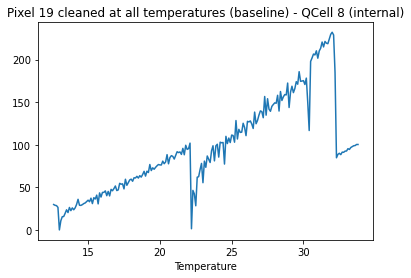

In [128]:
plt.plot(temps_set8_,pixels_cleaned8_[20][:])
plt.xlabel("Temperature")
plt.title("Pixel 19 cleaned at all temperatures (baseline) - QCell 8 (internal)")
plt.show()

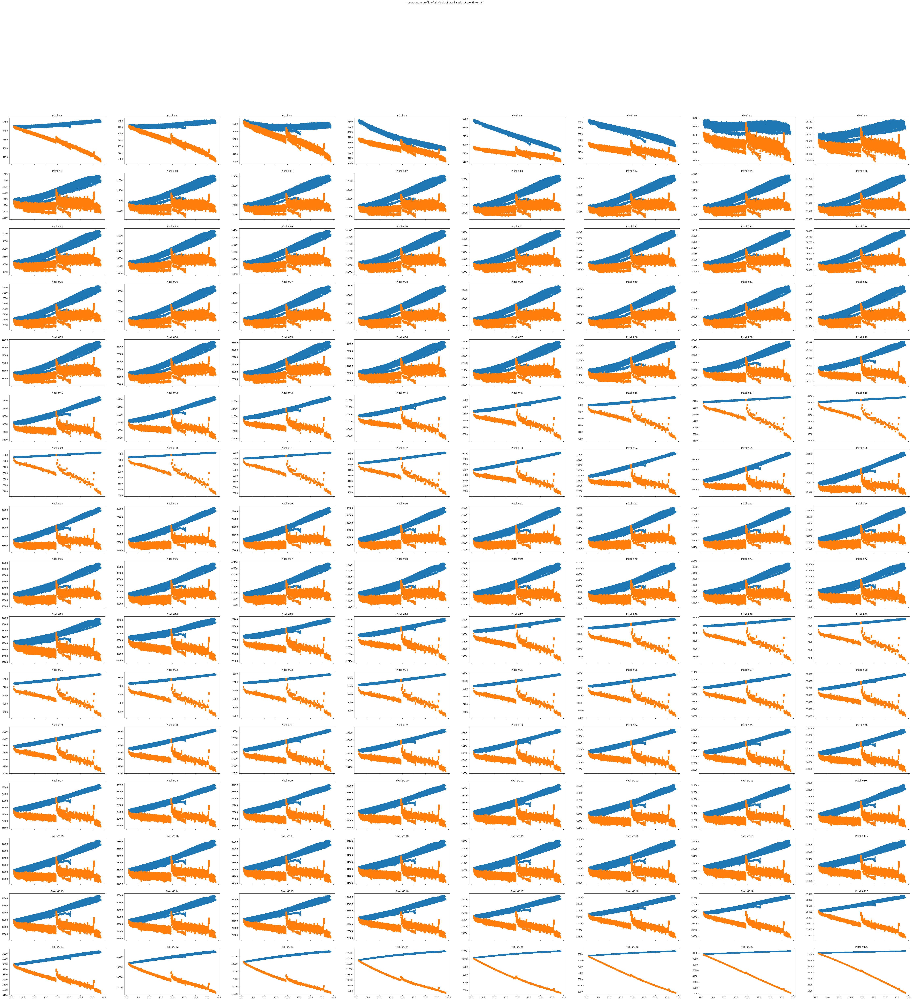

In [8]:
fig, axs = plt.subplots(nrows=16,ncols=8, sharex=True, figsize=(80, 80))
count = 0
for i in range(16):
    for j in range(8):
        axs[i,j].set_title(f"Pixel #{count+1}")
        axs[i,j].scatter(temps_dies8,pixels_dies8[count][:],label="Not compensated")
        axs[i,j].scatter(temps_dies8,pixels_dies_comp8_[count][:],label="Compensated")
        # x-axis is temperature, y-axis is pixel value
        # blue is Uncompensated, orange is Compensated
        count += 1
plt.suptitle("Temperature profile of all pixels of Qcell 8 with Diesel (internal)")
plt.show()